In [1]:
import opendatasets as od
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import os
%matplotlib inline

In [2]:
 #od.download('https://www.kaggle.com/jsphyg/weather-dataset-rattle-package')

In [3]:
os.listdir('weather-dataset-rattle-package')

['weatherAUS.csv']

In [4]:
raw_df = pd.read_csv('weather-dataset-rattle-package/weatherAUS.csv')

In [5]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [6]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [7]:
raw_df.dropna(subset=["RainTomorrow"],inplace=True)

In [8]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142193 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Cloud9am       88536 non-null

In [9]:
import plotly.express as ps

In [10]:
ps.histogram(raw_df,x='Location',color="RainTomorrow") 

In [11]:
ps.histogram(raw_df,x='Humidity3pm',color="RainTomorrow") 

In [12]:
ps.histogram(raw_df,x='Sunshine',color="RainTomorrow")

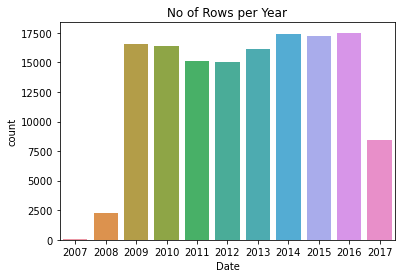

In [13]:
plt.title("No of Rows per Year")
sns.countplot(x=pd.to_datetime(raw_df.Date).dt.year);

In [14]:
year=pd.to_datetime(raw_df.Date).dt.year
train_df=raw_df[year<2015]
val_df=raw_df[year==2015]
test_df=raw_df[year>2015]

In [15]:
print(train_df.shape)
print(val_df.shape)
print(test_df.shape)

(98988, 23)
(17231, 23)
(25974, 23)


In [16]:
input_cols=list(train_df.columns)[1:-1]
target_cols="RainTomorrow"

In [17]:
train_inputs=train_df[input_cols].copy()
train_targets=train_df[target_cols].copy()

In [18]:
val_inputs=train_df[input_cols].copy()
val_targets=train_df[target_cols].copy()

In [19]:
test_inputs=train_df[input_cols].copy()
test_targets=train_df[target_cols].copy()

In [20]:
train_inputs 

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,SSE,...,26.0,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No
144549,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,SW,...,20.0,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No
144550,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,SSE,...,9.0,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No
144551,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,SSW,...,17.0,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No


In [21]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 98988, dtype: object

In [22]:
numerical_cols =train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols =train_inputs.select_dtypes(include="object").columns.tolist()

In [23]:
numerical_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [24]:
categorical_cols

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [25]:
from sklearn.impute import SimpleImputer

In [26]:
imputer= SimpleImputer(strategy="mean").fit(raw_df[numerical_cols])

In [27]:
train_inputs[numerical_cols]=imputer.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols]=imputer.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols]=imputer.transform(test_inputs[numerical_cols])

In [28]:
train_inputs[numerical_cols].isna().sum().sum()

0

In [29]:
val_inputs[numerical_cols].isna().sum().sum()

0

In [30]:
test_inputs[numerical_cols].isna().sum().sum()

0

In [31]:
from sklearn.preprocessing import MinMaxScaler

In [32]:
scaler=MinMaxScaler().fit(raw_df[numerical_cols])

In [33]:
train_inputs[numerical_cols]=scaler.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols]=scaler.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols]=scaler.transform(test_inputs[numerical_cols])

In [34]:
train_inputs[numerical_cols]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,0.516509,0.523629,0.001617,0.037723,0.525852,0.294574,0.153846,0.275862,0.71,0.22,0.449587,0.4800,0.888889,0.500352,0.508439,0.522073
1,0.375000,0.565217,0.000000,0.037723,0.525852,0.294574,0.030769,0.252874,0.44,0.25,0.497521,0.4912,0.493021,0.500352,0.514768,0.570058
2,0.504717,0.576560,0.000000,0.037723,0.525852,0.310078,0.146154,0.298851,0.38,0.30,0.447934,0.5056,0.493021,0.222222,0.594937,0.548944
3,0.417453,0.620038,0.000000,0.037723,0.525852,0.139535,0.084615,0.103448,0.45,0.16,0.613223,0.5712,0.493021,0.500352,0.533755,0.612284
4,0.613208,0.701323,0.002695,0.037723,0.525852,0.271318,0.053846,0.229885,0.82,0.33,0.500826,0.4624,0.777778,0.888889,0.527426,0.673704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,0.599057,0.718336,0.000000,0.037723,0.525852,0.286822,0.184615,0.298851,0.22,0.13,0.555372,0.5232,0.493021,0.500352,0.651899,0.714012
144549,0.556604,0.786389,0.000000,0.037723,0.525852,0.193798,0.146154,0.229885,0.16,0.08,0.530579,0.4880,0.493021,0.500352,0.761603,0.771593
144550,0.608491,0.805293,0.000000,0.037723,0.525852,0.255814,0.200000,0.103448,0.15,0.08,0.519008,0.4944,0.493021,0.500352,0.778481,0.788868
144551,0.674528,0.818526,0.000000,0.037723,0.525852,0.286822,0.215385,0.195402,0.22,0.09,0.553719,0.5136,0.493021,0.500352,0.780591,0.817658


In [35]:
train_inputs.describe().loc[["min","max"]]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
min,0.0,0.013233,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0304,0.0,0.0,0.027426,0.005758
max,1.0,1.000000,1.0,0.568276,0.986207,1.0,0.669231,1.0,1.0,1.0,1.0,1.0000,1.0,1.0,1.000000,0.988484


In [36]:
from sklearn.preprocessing import OneHotEncoder

In [37]:
encoder=OneHotEncoder

In [38]:
?OneHotEncoder

In [39]:
encoder=OneHotEncoder(sparse=False ,handle_unknown="ignore").fit(raw_df[categorical_cols])

In [40]:
encoder_cols =list(encoder.get_feature_names_out(categorical_cols))

In [41]:
encoder_cols

['Location_Adelaide',
 'Location_Albany',
 'Location_Albury',
 'Location_AliceSprings',
 'Location_BadgerysCreek',
 'Location_Ballarat',
 'Location_Bendigo',
 'Location_Brisbane',
 'Location_Cairns',
 'Location_Canberra',
 'Location_Cobar',
 'Location_CoffsHarbour',
 'Location_Dartmoor',
 'Location_Darwin',
 'Location_GoldCoast',
 'Location_Hobart',
 'Location_Katherine',
 'Location_Launceston',
 'Location_Melbourne',
 'Location_MelbourneAirport',
 'Location_Mildura',
 'Location_Moree',
 'Location_MountGambier',
 'Location_MountGinini',
 'Location_Newcastle',
 'Location_Nhil',
 'Location_NorahHead',
 'Location_NorfolkIsland',
 'Location_Nuriootpa',
 'Location_PearceRAAF',
 'Location_Penrith',
 'Location_Perth',
 'Location_PerthAirport',
 'Location_Portland',
 'Location_Richmond',
 'Location_Sale',
 'Location_SalmonGums',
 'Location_Sydney',
 'Location_SydneyAirport',
 'Location_Townsville',
 'Location_Tuggeranong',
 'Location_Uluru',
 'Location_WaggaWagga',
 'Location_Walpole',
 'Locat

In [42]:
train_inputs[encoder_cols]=encoder.transform(train_inputs[categorical_cols])

C:\Users\skidrow_pc\AppData\Local\Temp\ipykernel_1236\607397713.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\skidrow_pc\AppData\Local\Temp\ipykernel_1236\607397713.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\skidrow_pc\AppData\Local\Temp\ipykernel_1236\607397713.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

In [43]:
val_inputs[encoder_cols]=encoder.transform(val_inputs[categorical_cols])
test_inputs[encoder_cols]=encoder.transform(test_inputs[categorical_cols])

C:\Users\skidrow_pc\AppData\Local\Temp\ipykernel_1236\3069453292.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\skidrow_pc\AppData\Local\Temp\ipykernel_1236\3069453292.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\skidrow_pc\AppData\Local\Temp\ipykernel_1236\3069453292.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de

In [44]:
X_train=train_inputs[numerical_cols +encoder_cols]
X_val=val_inputs[numerical_cols +encoder_cols]
X_test=test_inputs[numerical_cols +encoder_cols]

In [45]:
X_train

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes,RainToday_nan
0,0.516509,0.523629,0.001617,0.037723,0.525852,0.294574,0.153846,0.275862,0.71,0.22,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
1,0.375000,0.565217,0.000000,0.037723,0.525852,0.294574,0.030769,0.252874,0.44,0.25,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
2,0.504717,0.576560,0.000000,0.037723,0.525852,0.310078,0.146154,0.298851,0.38,0.30,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.417453,0.620038,0.000000,0.037723,0.525852,0.139535,0.084615,0.103448,0.45,0.16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.613208,0.701323,0.002695,0.037723,0.525852,0.271318,0.053846,0.229885,0.82,0.33,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,0.599057,0.718336,0.000000,0.037723,0.525852,0.286822,0.184615,0.298851,0.22,0.13,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
144549,0.556604,0.786389,0.000000,0.037723,0.525852,0.193798,0.146154,0.229885,0.16,0.08,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
144550,0.608491,0.805293,0.000000,0.037723,0.525852,0.255814,0.200000,0.103448,0.15,0.08,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
144551,0.674528,0.818526,0.000000,0.037723,0.525852,0.286822,0.215385,0.195402,0.22,0.09,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [46]:
from sklearn.tree import DecisionTreeClassifier

In [47]:
model=DecisionTreeClassifier(random_state=42)

In [48]:
train_targets

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 98988, dtype: object

In [49]:
%%time
model.fit(X_train,train_targets)

CPU times: total: 3.59 s
Wall time: 3.63 s


DecisionTreeClassifier(random_state=42)

In [50]:
train_preds=model.predict(X_train)

In [51]:
pd.value_counts(train_preds)

No     76707
Yes    22281
dtype: int64

In [52]:
from sklearn.metrics import accuracy_score,confusion_matrix

In [53]:
accuracy_score(train_preds,train_targets)

0.9999797955307714

In [54]:
train_probs=model.predict_proba(X_train)

In [55]:
train_probs

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [56]:
model.score(X_val,val_targets)

0.9999797955307714

In [57]:
val_targets.value_counts()/len(val_targets)

No     0.774892
Yes    0.225108
Name: RainTomorrow, dtype: float64

In [58]:
from sklearn.tree import plot_tree, export_text

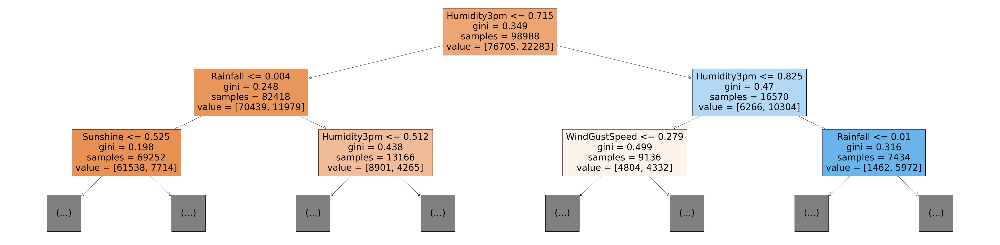

In [59]:
plt.figure(figsize=(80,20))
plot_tree(model,feature_names=X_train.columns,max_depth=2,filled=True);

In [60]:
model.tree_.max_depth # to check the maximum Depth of the Tree

48

In [61]:
tree_text=export_text(model,max_depth=10,feature_names=list(X_train.columns))

In [62]:
print(tree_text)     #this is another Way to see the tree strucutre by using the Text format

|--- Humidity3pm <= 0.72
|   |--- Rainfall <= 0.00
|   |   |--- Sunshine <= 0.52
|   |   |   |--- Pressure3pm <= 0.58
|   |   |   |   |--- WindGustSpeed <= 0.36
|   |   |   |   |   |--- Humidity3pm <= 0.28
|   |   |   |   |   |   |--- WindDir9am_NE <= 0.50
|   |   |   |   |   |   |   |--- Location_Watsonia <= 0.50
|   |   |   |   |   |   |   |   |--- Cloud9am <= 0.83
|   |   |   |   |   |   |   |   |   |--- WindSpeed3pm <= 0.07
|   |   |   |   |   |   |   |   |   |   |--- Pressure3pm <= 0.46
|   |   |   |   |   |   |   |   |   |   |   |--- class: Yes
|   |   |   |   |   |   |   |   |   |   |--- Pressure3pm >  0.46
|   |   |   |   |   |   |   |   |   |   |   |--- class: No
|   |   |   |   |   |   |   |   |   |--- WindSpeed3pm >  0.07
|   |   |   |   |   |   |   |   |   |   |--- MinTemp <= 0.32
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |   |--- MinTemp >  0.32
|   |   |   |   |   |   |   |   |   |   |   |--- truncated

In [63]:
model.feature_importances_

array([3.48942086e-02, 3.23605486e-02, 5.91385668e-02, 2.49619907e-02,
       4.94652143e-02, 5.63334673e-02, 2.80205998e-02, 2.98128801e-02,
       4.02182908e-02, 2.61441297e-01, 3.44145027e-02, 6.20573699e-02,
       1.36406176e-02, 1.69229866e-02, 3.50001550e-02, 3.04064076e-02,
       2.24086587e-03, 2.08018104e-03, 1.27475954e-03, 7.26936324e-04,
       1.39779517e-03, 1.15264873e-03, 6.92808159e-04, 1.80675598e-03,
       1.08370901e-03, 1.19773895e-03, 8.87119103e-04, 2.15764220e-03,
       1.67094731e-03, 7.98919493e-05, 1.10558668e-03, 1.42008656e-03,
       4.10087635e-04, 1.09028115e-03, 1.44164766e-03, 9.08284767e-04,
       1.05770304e-03, 6.18133455e-04, 1.80387272e-03, 2.10403527e-03,
       2.74413333e-04, 7.31599405e-04, 1.35408990e-03, 1.54759332e-03,
       1.30917564e-03, 1.07134670e-03, 8.36408023e-04, 1.62662229e-03,
       1.00326116e-03, 2.16053455e-03, 8.46802258e-04, 1.88919081e-03,
       9.29325203e-04, 1.29545157e-03, 1.27604831e-03, 5.12736888e-04,
      

In [64]:
importance_df=pd.DataFrame({
    'feature':X_train.columns,
    "importance":model.feature_importances_
}).sort_values('importance',ascending=False)

In [65]:
importance_df.head(10)

,feature,importance
9,Humidity3pm,0.261441
11,Pressure3pm,0.062057
2,Rainfall,0.059139
5,WindGustSpeed,0.056333
4,Sunshine,0.049465
8,Humidity9am,0.040218
14,Temp9am,0.035000
0,MinTemp,0.034894
10,Pressure9am,0.034415
1,MaxTemp,0.032361


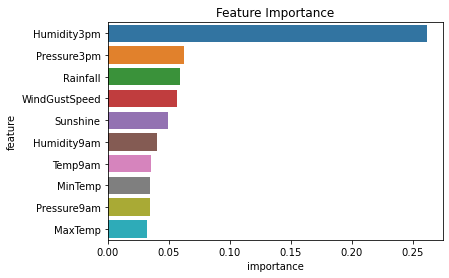

In [66]:
plt.title("Feature Importance")
sns.barplot(data=importance_df.head(10),x="importance",y="feature");

In [67]:
model=DecisionTreeClassifier(max_depth=3,random_state=42)

In [68]:
model.fit(X_train,train_targets)

DecisionTreeClassifier(max_depth=3, random_state=42)

In [69]:
model.score(X_train,train_targets)

0.8291308037337859

In [70]:
model.score(X_val,val_targets)

0.8291308037337859

In [71]:
model.classes_

array(['No', 'Yes'], dtype=object)

[Text(0.5, 0.875, 'Humidity3pm <= 0.715\ngini = 0.349\nsamples = 98988\nvalue = [76705, 22283]\nclass = No'),
 Text(0.25, 0.625, 'Rainfall <= 0.004\ngini = 0.248\nsamples = 82418\nvalue = [70439, 11979]\nclass = No'),
 Text(0.125, 0.375, 'Sunshine <= 0.525\ngini = 0.198\nsamples = 69252\nvalue = [61538, 7714]\nclass = No'),
 Text(0.0625, 0.125, 'gini = 0.363\nsamples = 12620\nvalue = [9618, 3002]\nclass = No'),
 Text(0.1875, 0.125, 'gini = 0.153\nsamples = 56632\nvalue = [51920, 4712]\nclass = No'),
 Text(0.375, 0.375, 'Humidity3pm <= 0.512\ngini = 0.438\nsamples = 13166\nvalue = [8901, 4265]\nclass = No'),
 Text(0.3125, 0.125, 'gini = 0.293\nsamples = 4299\nvalue = [3531, 768]\nclass = No'),
 Text(0.4375, 0.125, 'gini = 0.478\nsamples = 8867\nvalue = [5370, 3497]\nclass = No'),
 Text(0.75, 0.625, 'Humidity3pm <= 0.825\ngini = 0.47\nsamples = 16570\nvalue = [6266, 10304]\nclass = Yes'),
 Text(0.625, 0.375, 'WindGustSpeed <= 0.279\ngini = 0.499\nsamples = 9136\nvalue = [4804, 4332]\ncla

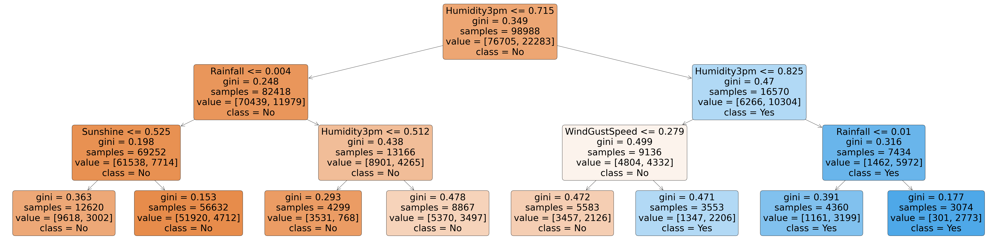

In [72]:
plt.figure(figsize=(80,20))
plot_tree(model,feature_names=X_train.columns,filled =True ,rounded =True,class_names=model.classes_)

In [73]:
def max_depth_error(md):
    model=DecisionTreeClassifier(max_depth=md,random_state=42)
    model.fit(X_train,train_targets)
    train_error=1-model.score(X_train,train_targets)
    val_error=1-model.score(X_val,val_targets)
    return {"Max Depth":md,"Train Error":train_error,"Validation Error":val_error}

In [74]:
%%time
error_df=pd.DataFrame([max_depth_error(md) for md in range(1,21)])

CPU times: total: 44.4 s
Wall time: 44.8 s


In [75]:
error_df


,Max Depth,Train Error,Validation Error
0,1,0.184315,0.184315
1,2,0.179547,0.179547
2,3,0.170869,0.170869
3,4,0.165707,0.165707
4,5,0.160676,0.160676
5,6,0.156271,0.156271
6,7,0.153312,0.153312
7,8,0.147806,0.147806
8,9,0.140906,0.140906
9,10,0.132945,0.132945


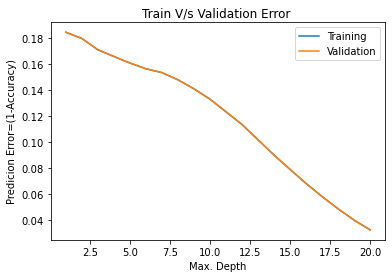

In [76]:
plt.figure()
plt.plot(error_df["Max Depth"],error_df["Train Error"])
plt.plot(error_df["Max Depth"],error_df["Validation Error"])
plt.title("Train V/s Validation Error ")
plt.xlabel("Max. Depth")
plt.ylabel("Predicion Error=(1-Accuracy)")
plt.legend(["Training","Validation"]);


## this is called Hyper parameter Tuning 

In [77]:
model=DecisionTreeClassifier(max_depth=7,random_state=42).fit(X_train,train_targets)
model.score(X_train,train_targets)

0.8466884874934335

### Max_leaf_node Hyper parameter Tuning 

In [78]:
model=DecisionTreeClassifier(max_leaf_nodes=128,random_state=42)

In [79]:
model.fit(X_train,train_targets)

DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [80]:
model.score(X_train,train_targets)

0.8480421869317493

In [81]:
model.tree_.max_depth

12

In [82]:
model_text=export_text(model,feature_names=list(X_train.columns))
print(model_text[:3000])

|--- Humidity3pm <= 0.72
|   |--- Rainfall <= 0.00
|   |   |--- Sunshine <= 0.52
|   |   |   |--- Pressure3pm <= 0.58
|   |   |   |   |--- WindGustSpeed <= 0.36
|   |   |   |   |   |--- Humidity3pm <= 0.28
|   |   |   |   |   |   |--- class: No
|   |   |   |   |   |--- Humidity3pm >  0.28
|   |   |   |   |   |   |--- Sunshine <= 0.05
|   |   |   |   |   |   |   |--- class: Yes
|   |   |   |   |   |   |--- Sunshine >  0.05
|   |   |   |   |   |   |   |--- Pressure3pm <= 0.43
|   |   |   |   |   |   |   |   |--- class: Yes
|   |   |   |   |   |   |   |--- Pressure3pm >  0.43
|   |   |   |   |   |   |   |   |--- Humidity3pm <= 0.57
|   |   |   |   |   |   |   |   |   |--- WindDir9am_NE <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- WindDir9am_NNE <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- class: No
|   |   |   |   |   |   |   |   |   |   |--- WindDir9am_NNE >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- class: No
|   |   |   |   |   |   |   |   |   |--- WindD

In [83]:
from sklearn.ensemble import RandomForestClassifier

In [84]:
model=RandomForestClassifier(n_jobs=-1,random_state=42)

In [85]:
%%time
model.fit(X_train,train_targets)

CPU times: total: 53.6 s
Wall time: 16.7 s


RandomForestClassifier(n_jobs=-1, random_state=42)

In [86]:
model.score(X_train,train_targets)

0.9999494888269285

In [87]:
model.score(X_val,val_targets)

0.9999494888269285

In [88]:
train_probs=model.predict_proba(X_train)
train_probs

array([[0.93, 0.07],
       [1.  , 0.  ],
       [0.99, 0.01],
       ...,
       [0.99, 0.01],
       [1.  , 0.  ],
       [0.96, 0.04]])

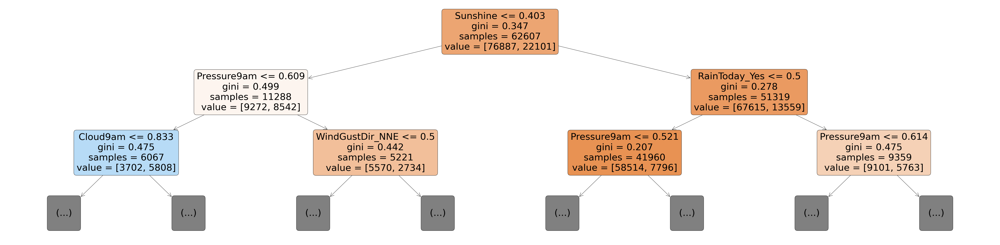

In [89]:
plt.figure(figsize=(80,20)) 
plot_tree(model.estimators_[0],max_depth=2,feature_names=X_train.columns,filled=True,rounded=True);

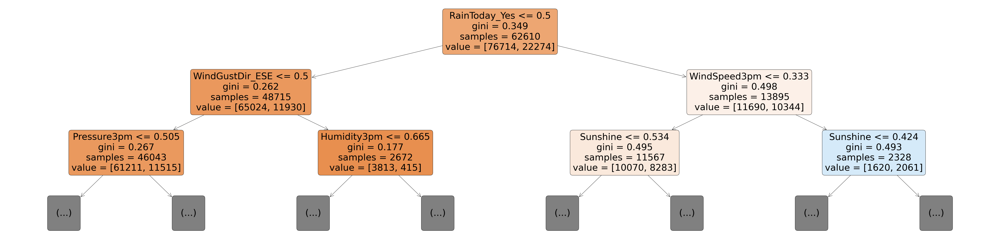

In [90]:
plt.figure(figsize=(80,20)) 
plot_tree(model.estimators_[20],max_depth=2,feature_names=X_train.columns,filled=True,rounded=True);

In [91]:
len(model.estimators_)

100

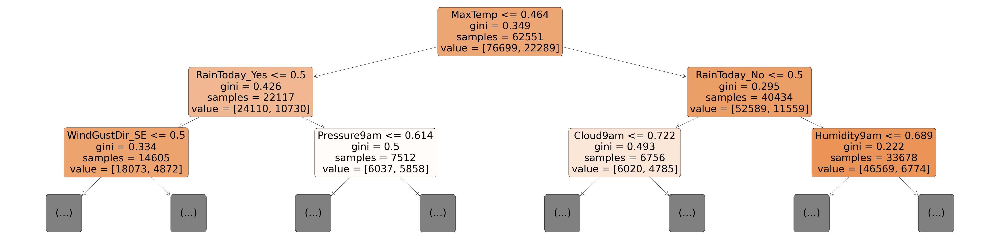

In [92]:
plt.figure(figsize=(80,20)) 
plot_tree(model.estimators_[99],max_depth=2,feature_names=X_train.columns,filled=True,rounded=True);

In [93]:
importance_df=pd.DataFrame({
    "feature":X_train.columns,
    "importance":model.feature_importances_
}).sort_values("importance",ascending=False)

In [94]:
importance_df.head(10)

,feature,importance
9,Humidity3pm,0.139904
4,Sunshine,0.053696
11,Pressure3pm,0.052713
8,Humidity9am,0.050051
2,Rainfall,0.048077
10,Pressure9am,0.047944
5,WindGustSpeed,0.047477
15,Temp3pm,0.044379
1,MaxTemp,0.041865
0,MinTemp,0.041199


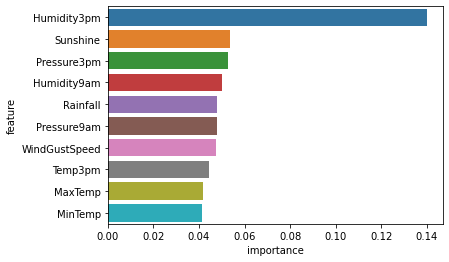

In [95]:
sns.barplot(data=importance_df.head(10),x="importance",y="feature");

#### Hyper Parameter Turning 

In [96]:
base_model=RandomForestClassifier(random_state=42 ,n_jobs=-1).fit(X_train,train_targets)

In [97]:
base_train_acc=base_model.score(X_train,train_targets)
base_val_acc=base_model.score(X_val,val_targets)

In [98]:
print(base_train_acc)
print(base_val_acc)

0.9999494888269285
0.9999494888269285


In [99]:
base_accs=base_train_acc,base_val_acc
type(base_accs)

tuple

In [100]:
type(base_train_acc)

numpy.float64

#### N-estimator
##### model with 10 estmator

In [101]:
model=RandomForestClassifier(random_state=42,n_jobs=-1,n_estimators=10).fit(X_train,train_targets)

In [102]:
model.score(X_train,train_targets),model.score(X_val,val_targets),

(0.986958015112943, 0.986958015112943)

###### Model with 200 estimator

In [103]:
model=RandomForestClassifier(random_state=42,n_jobs=-1,n_estimators=200).fit(X_train,train_targets)

In [104]:
model.score(X_train,train_targets),model.score(X_val,val_targets)

(0.9999797955307714, 0.9999797955307714)

In [105]:
def test_params(**params):    
    model=RandomForestClassifier(random_state=42,n_jobs=-1,**params).fit(X_train,train_targets)
    return model.score(X_train,train_targets),model.score(X_val,val_targets)


In [106]:
test_params(max_depth=6,max_leaf_nodes=1024,n_estimators=1000)


KeyboardInterrupt



In [ ]:
%%time
test_params(max_depth=6)

In [ ]:
test_params(max_leaf_nodes=400)

#### MAX Feature

In [ ]:
X_train.columns

In [ ]:
test_params(max_features="log2")

In [ ]:
test_params(max_features=3)

In [ ]:
test_params(max_features=20)

#### MIN SPLIT & MIN SAMPLES LEAF

In [ ]:
test_params(min_samples_split=5,min_samples_leaf=2)

In [ ]:
test_params(min_samples_split=100,min_samples_leaf=60)

#### min _impurity _decrease 

In [ ]:
test_params(min_impurity_decrease=1e-7)

In [ ]:
test_params(min_impurity_decrease=1e-2)

In [ ]:
test_params(min_impurity_decrease=1e-5)

#### BOOTSTRAP     AND    MAX_SAMPLES

In [ ]:
test_params(bootstrap=False)

In [ ]:
test_params(max_samples=0.9)

In [ ]:
base_accs

##### CLASS_WEIGHT

In [ ]:
train_targets.value_counts()

In [ ]:
train_targets.value_counts()/len(train_targets)

In [ ]:
model.classes_

In [ ]:
test_params(class_weight="balanced")

In [ ]:
test_params(class_weight={"No":1,"Yes":2})

In [ ]:
base_accs

In [ ]:
model=RandomForestClassifier(n_jobs=-1,
                             random_state=42,
                             n_estimators=500,
                             max_features=20,
                             max_depth=30,
                            class_weight={"No":1,"Yes":1.5})

In [ ]:
model.fit(X_train,train_targets)

In [ ]:
model.score(X_train,train_targets),model.score(X_val,val_targets)

In [ ]:
base_accs

In [ ]:
raw_df.head()

In [ ]:
model.score(X_test,test_targets),model.score(X_test,test_targets)

In [ ]:
def predict_input(model, single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numerical_cols] = imputer.transform(input_df[numerical_cols])
    input_df[numerical_cols] = scaler.transform(input_df[numerical_cols])
    input_df[encoder_cols] = encoder.transform(input_df[categorical_cols])
    X_input = input_df[numerical_cols + encoder_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict_proba(X_input)[0][list(model.classes_).index(pred)]
    return pred, prob

In [ ]:
new_input = {'Date': '2021-06-19',
             'Location': 'Launceston',
             'MinTemp': 23.2,
             'MaxTemp': 33.2,
             'Rainfall': 10.2,
             'Evaporation': 4.2,
             'Sunshine': np.nan,
             'WindGustDir': 'NNW',
             'WindGustSpeed': 52.0,
             'WindDir9am': 'NW',
             'WindDir3pm': 'NNE',
             'WindSpeed9am': 13.0,
             'WindSpeed3pm': 20.0,
             'Humidity9am': 89.0,
             'Humidity3pm': 58.0,
             'Pressure9am': 1004.8,
             'Pressure3pm': 1001.5,
             'Cloud9am': 8.0,
             'Cloud3pm': 5.0,
             'Temp9am': 25.7,
             'Temp3pm': 33.0,
             'RainToday': 'Yes'}

In [ ]:
predict_input(model,new_input)

In [ ]:
import joblib

In [ ]:
aussie_rain_with_random_forest={
    "model":model,
    "imputer":imputer,
    "scaler":scaler,
    "encoder":encoder,
    "input_cols":input_cols,
    "target_cols":target_cols,
    "numeric_cols":numerical_cols,
    "categorical_cols":categorical_cols,
    "encoder_cols":encoder_cols
}

In [ ]:
joblib.dump(aussie_rain_with_random_forest,"aussie_rain_with_random_forest.joblib")
